In [37]:
import os
from glob import glob
from collections import namedtuple
import xarray as xr
import matplotlib.pyplot as plt

In [ ]:
def get_ClusterClient(
        ncores=1,
        nmem='25GB',
        walltime='01:00:00',
        account='UWAS0155'):
    """
    Code from Daniel Kennedy
    More info about Dask on HPC - https://ncar.github.io/dask-tutorial/notebooks/05-dask-hpc.html
    """
    from dask_jobqueue import PBSCluster
    from dask.distributed import Client

    cluster = PBSCluster(
        cores=ncores,              # The number of cores you want
        memory=nmem,               # Amount of memory
        processes=ncores,          # How many processes
        queue='casper',            # Queue name
        resource_spec='select=1:ncpus=' +\
        str(ncores)+':mem='+nmem,  # Specify resources
        account=account,           # Input your project ID here
        walltime=walltime,         # Amount of wall time
        interface='ext',           # Interface to use
    )

    client = Client(cluster)
    return cluster, client


## Create Dask cluster and client, scale up to 20 workers
if "cluster" not in globals():
    cluster, client = get_ClusterClient(nmem="5GB")
    cluster.scale(10)

    ## Wait for cluster to be set up
    import time
    time.sleep(5)

## Check the status of the cluster
print(client)

## Prints the PBS job script that is used to submit the Dask workers
# print(cluster.job_script())

## Lists active workers and their status
print(cluster.workers)

## Lists current jobs in Casper queue
# !qstat -x -u $USER

## Create the SSH tunnel to access the Dask dashboard locally
port = cluster.dashboard_link.split(":")[2].split("/")[0]
address = cluster.dashboard_link.split(":")[1][2:]
print(f"ssh -N -L {port}:{address}:{port} bbuchovecky@casper.hpc.ucar.edu")  # local command line argument
print(f"http://localhost:{port}/status")  # link to local dask dashboard

<Client: 'tcp://128.117.211.222:35905' processes=0 threads=0, memory=0 B>
{}
ssh -N -L 8787:128.117.211.222:8787 bbuchovecky@casper.hpc.ucar.edu
http://localhost:8787/status


Task exception was never retrieved
future: <Task finished name='Task-1229781' coro=<Client._gather.<locals>.wait() done, defined at /glade/u/home/bbuchovecky/miniforge3/envs/cpl_ppe_co2/lib/python3.12/site-packages/distributed/client.py:2391> exception=AllExit()>
Traceback (most recent call last):
  File "/glade/u/home/bbuchovecky/miniforge3/envs/cpl_ppe_co2/lib/python3.12/site-packages/distributed/client.py", line 2400, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
future: <Task finished name='Task-1229392' coro=<Client._gather.<locals>.wait() done, defined at /glade/u/home/bbuchovecky/miniforge3/envs/cpl_ppe_co2/lib/python3.12/site-packages/distributed/client.py:2391> exception=AllExit()>
Traceback (most recent call last):
  File "/glade/u/home/bbuchovecky/miniforge3/envs/cpl_ppe_co2/lib/python3.12/site-packages/distributed/client.py", line 2400, in wait
    raise AllExit()
distributed.client.AllExit
Task exception was never retrieved
futur

In [ ]:
def _shift_time(da):
    if (da.time[0].dt.month.item() == 2) and (da.time[-1].dt.month.item() == 1):
        new_time = xr.date_range(
            start=str(da.time[0].dt.year.item()) + "-01",
            end=str(da.time[-1].dt.year.item() - 1) + "-12",
            freq="MS",
            calendar="noleap",
            use_cftime=True,
        )
        return da.assign_coords(time=new_time)
    return da


def _get_chunk_size_from_res(case):
    if "f09_f09" in case:
        chunk_size = {"time": 1024}
    else:
        chunk_size = {"time": 2048}
    return chunk_size


def check_frequency(ds):
    time_steps_per_year = len(ds.time) / (ds.time[-1].dt.year - ds.time[0].dt.year + 1)
    if time_steps_per_year == 12:
        freq = "monthly"
    elif time_steps_per_year == 1:
        freq = "yearly"
    else:
        freq = "unknown"
    return freq


def load_variables(varnames, case, basedir, domain="lnd", htape="h0", suffix=""):
    def _keep_var(ds):
        return ds[varnames]

    component = {
        "lnd": "clm2",
        "atm": "cam",
    }

    if len(suffix):
        suffix = "."+suffix

    if varnames:
        data = xr.open_mfdataset(
            f"{basedir}/{case}{suffix}/{domain}/hist/{case}.{component[domain]}.{htape}.*.nc",
            combine="by_coords",
            decode_timedelta=False,
            parallel=True,
            preprocess=_keep_var,
            chunks=_get_chunk_size_from_res(case),
            engine="netcdf4",
        )
    else:
        data = xr.open_mfdataset(
            f"{basedir}/{case}{suffix}/{domain}/hist/{case}.{component[domain]}.{htape}.*.nc",
            combine="by_coords",
            decode_timedelta=False,
            parallel=True,
            chunks=_get_chunk_size_from_res(case),
            engine="netcdf4",
        )

    return _shift_time(data)


SIM_DIR = "/glade/u/home/bbuchovecky/projects/cpl_ppe_co2/sims"
ARCH_DIR = "/glade/derecho/scratch/bbuchovecky/archive"
VARIABLES = [
    "TLAI", "TOTECOSYSC", "TOTVEGC", "TOTSOMC",                    # vegetation and carbon
    "RAIN", "QRUNOFF", "QSOIL", "QVEGE", "QVEGT", "TWS",  # water budget
    "EFLX_LH_TOT", "FSH", "FIRE", "FLDS", "FSR", "FSDS", "FGR",    # surface energy budget
    "TSA",                                                         # climate state
]

case = "coupPPE.000"

cplhist = load_variables(VARIABLES, "f.e21.FHIST_BGC.f19_f19_mg17.historical.coupPPE.cplhist", ARCH_DIR).sel(time=slice("1850-01", "1984-12"))
ihist = load_variables(VARIABLES, f"IHistClm50Bgc.CPLHIST.historical.{case}.IHIST", ARCH_DIR)
fhist = load_variables(VARIABLES, f"f.e21.FHIST_BGC.f19_f19_mg17.historical.{case}", ARCH_DIR)

fh0 = glob(f"{ARCH_DIR}/IHistClm50Bgc.CPLHIST.historical.{case}.IHIST/lnd/hist/*.h0.*")
grid = xr.open_dataset(fh0[0], decode_timedelta=True, engine="netcdf4")[["area", "landfrac"]]
la = (grid.area * 1e6 * grid.landfrac).fillna(0).compute()  #m2
lw = (la / la.sum()).compute()

ConversionFactor = namedtuple("ConversionFactor", ["cf", "unit", "kind"])
cfs = {
    "TLAI": ConversionFactor(lw, "m2/m2", "intensive"),
    "TOTECOSYSC": ConversionFactor(la/1e15, "PgC", "extensive"),
    "TOTVEGC": ConversionFactor(la/1e15, "PgC", "extensive"),
    "TOTSOMC": ConversionFactor(la/1e15, "PgC", "extensive"),
    "RAIN": ConversionFactor(lw, "mm/s", "intensive"),
    "QRUNOFF": ConversionFactor(lw, "mm/s", "intensive"),
    "QSOIL": ConversionFactor(lw, "mm/s", "intensive"),
    "QVEGE": ConversionFactor(lw, "mm/s", "intensive"),
    "QVEGT": ConversionFactor(lw, "mm/s", "intensive"),
    "TWS": ConversionFactor(lw, "mm", "intensive"),
    "EFLX_LH_TOT": ConversionFactor(lw, "W/m2", "intensive"),
    "FSH": ConversionFactor(lw, "W/m2", "intensive"),
    "FIRE": ConversionFactor(lw, "W/m2", "intensive"),
    "FLDS": ConversionFactor(lw, "W/m2", "intensive"),
    "FSR": ConversionFactor(lw, "W/m2", "intensive"),
    "FSDS": ConversionFactor(lw, "W/m2", "intensive"),
    "FGR": ConversionFactor(lw, "W/m2", "intensive"),
    "TSA": ConversionFactor(lw, "K", "intensive"),
}
labels = {
    "intensive": "mean",
    "extensive": "total"
}

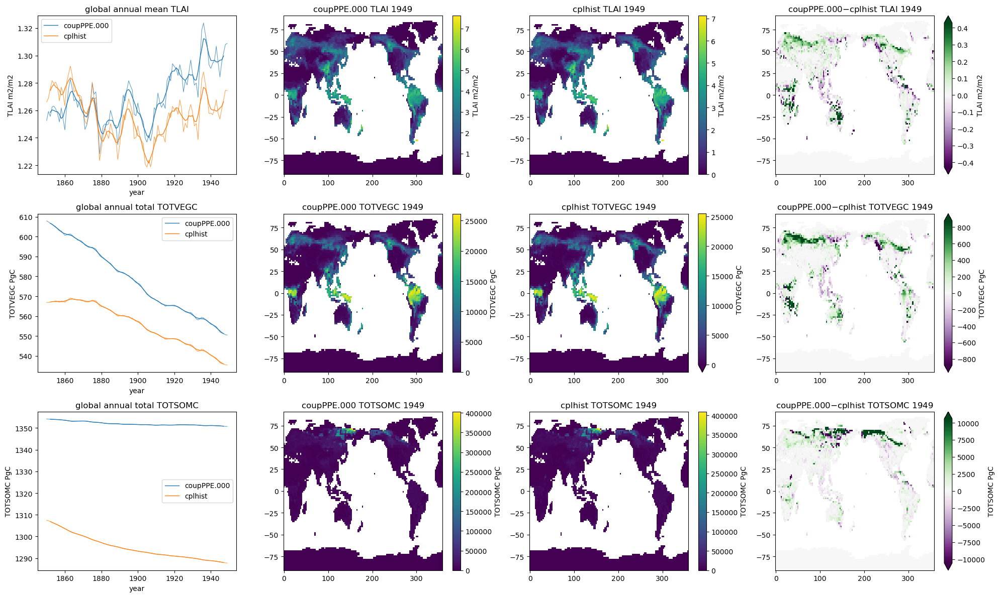

In [39]:
# Figure 1: carbon (land ICs)
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12), layout="tight")
ax = axes.flatten()
for i,v in enumerate(["TLAI", "TOTVEGC", "TOTSOMC"]):

    ihist_ann = (ihist[v]*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()
    cplhist_ann = (cplhist[v]*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()

    ihist_ann.plot(ax=ax[4*i], color="tab:blue", alpha=0.75, lw=0.75)
    ihist_ann.rolling(year=5, center=True).mean().plot(ax=ax[4*i], color="tab:blue", alpha=1, lw=1, label=case)
    cplhist_ann.plot(ax=ax[4*i], color="tab:orange", alpha=0.75, lw=0.75)
    cplhist_ann.rolling(year=5, center=True).mean().plot(ax=ax[4*i], color="tab:orange", alpha=1, lw=1, label="cplhist")

    ax[4*i].set_ylabel(f"{v} [{cfs[v].unit}]")
    ax[4*i].set_title(f"global annual {labels[cfs[v].kind]} {v}")
    ax[4*i].legend()

    ihist[v].sel(time=slice("1949-01", "1949-12")).mean(dim="time").plot(ax=ax[4*i+1], vmin=0, cbar_kwargs={"label": f"{v} [{cfs[v].unit}]"})
    ax[4*i+1].set_title(f"{case} {v} 1949")

    cplhist[v].sel(time=slice("1949-01", "1949-12")).mean(dim="time").plot(ax=ax[4*i+2], vmin=0, cbar_kwargs={"label": f"{v} [{cfs[v].unit}]"})
    ax[4*i+2].set_title(f"cplhist {v} 1949")

    (ihist[v].sel(time=slice("1949-01", "1949-12")) - cplhist[v].sel(time=slice("1949-01", "1949-12"))).mean(dim="time").plot(ax=ax[4*i+3], cmap="PRGn", robust=True, cbar_kwargs={"label": f"{v} [{cfs[v].unit}]"})
    ax[4*i+3].set_title(f"{case}$-$cplhist {v} 1949")

    for j in range(1,4):
        ax[4*i+j].set_ylabel("")
        ax[4*i+j].set_xlabel("")

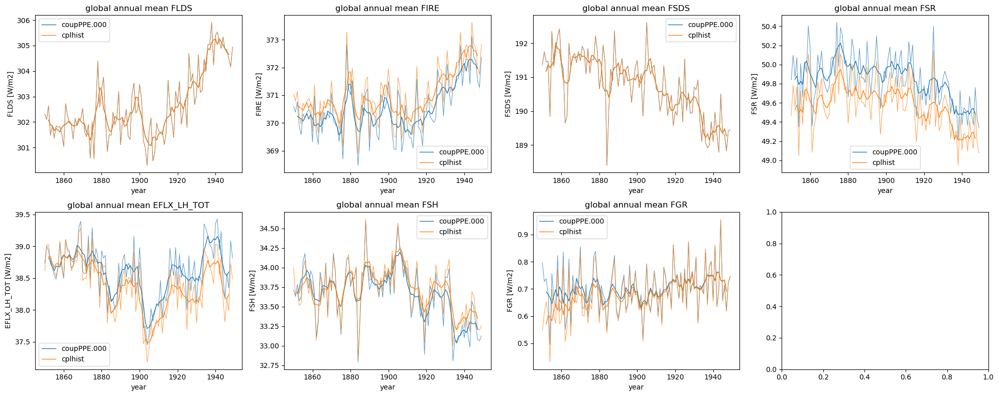

In [ ]:
# Figure 2: surface energy terms
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 8), layout="tight")
ax = axes.flatten()
for i,v in enumerate(["FLDS", "FIRE", "FSDS", "FSR", "EFLX_LH_TOT", "FSH", "FGR", "TSA"]):
    ihist_ann = (ihist[v]*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()    
    cplhist_ann = (cplhist[v]*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()

    ihist_ann.plot(ax=ax[i], color="tab:blue", alpha=0.5, lw=0.75)
    ihist_ann.rolling(year=5, center=True).mean().plot(ax=ax[i], color="tab:blue", alpha=1, lw=1, label=MEM)
    cplhist_ann.plot(ax=ax[i], color="tab:orange", alpha=0.5, lw=0.75)
    cplhist_ann.rolling(year=5, center=True).mean().plot(ax=ax[i], color="tab:orange", alpha=1, lw=1, label="cplhist")

    ax[i].set_ylabel(f"{v} [{cfs[v].unit}]")
    ax[i].set_title(f"global annual {labels[cfs[v].kind]} {v}")
    ax[i].legend()

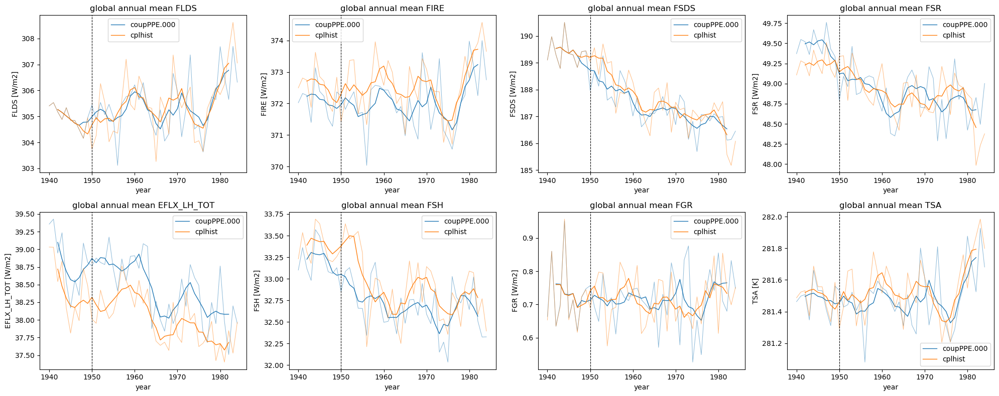

In [13]:
MEM = "coupPPE.000"
START_TIME = "1940-01"

# Figure 2: surface energy terms
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 8), layout="tight")
ax = axes.flatten()
for i,v in enumerate(["FLDS", "FIRE", "FSDS", "FSR", "EFLX_LH_TOT", "FSH", "FGR", "TSA"]):
    ihist_ann = (ihist[v].sel(time=slice(START_TIME,None))*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()
    fhist_ann = (fhist[v]*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()
    ifhist_ann = xr.concat([ihist_ann, fhist_ann], dim="year")
    cplhist_ann = (cplhist[v].sel(time=slice(START_TIME,None))*cfs[v].cf).sum(dim=["lat","lon"]).groupby("time.year").mean().compute()

    # ihist_ann.plot(ax=ax[i], color="tab:blue", ls="--", alpha=0.5, lw=0.75)
    # ihist_ann.rolling(year=5, center=True).mean().plot(ax=ax[i], color="tab:blue", ls="--", alpha=1, lw=1, label=MEM)
    # fhist_ann.plot(ax=ax[i], color="tab:blue", alpha=0.5, lw=0.75)
    # fhist_ann.rolling(year=5, center=True).mean().plot(ax=ax[i], color="tab:blue", alpha=1, lw=1, label=MEM)
    ifhist_ann.plot(ax=ax[i], color="tab:blue", alpha=0.5, lw=0.75)
    ifhist_ann.rolling(year=5, center=True).mean().plot(ax=ax[i], color="tab:blue", alpha=1, lw=1, label=MEM)
    cplhist_ann.plot(ax=ax[i], color="tab:orange", alpha=0.5, lw=0.75)
    cplhist_ann.rolling(year=5, center=True).mean().plot(ax=ax[i], color="tab:orange", alpha=1, lw=1, label="cplhist")
    ax[i].axvline(1950, c="k", ls="--", lw=0.8)

    ax[i].set_ylabel(f"{v} [{cfs[v].unit}]")
    ax[i].set_title(f"global annual {labels[cfs[v].kind]} {v}")
    ax[i].legend()

fig.savefig("coupPPE.000_sfcenergy.png", dpi=300)

Text(0.5, 0, '')

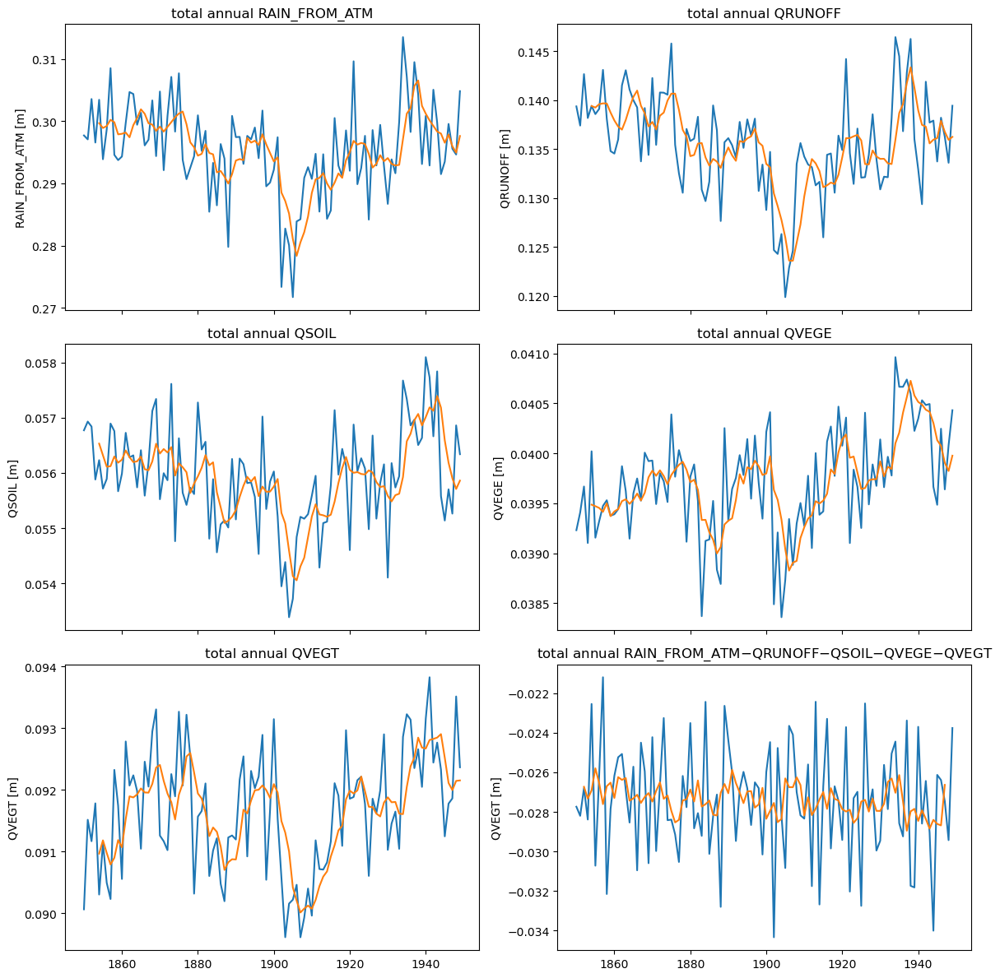

In [28]:
fig, axes = plt.subplots(nrows=3, ncols=2, sharex=True, figsize=(12, 12), layout="tight")
ax = axes.flatten()

yabs = 0
for i,v in enumerate(["RAIN_FROM_ATM", "QRUNOFF", "QSOIL", "QVEGE", "QVEGT"]):
    (ihist[v]*1000).weighted(la).mean(dim=["lat", "lon"]).groupby("time.year").sum().plot(ax=ax[i])
    (ihist[v]*1000).weighted(la).mean(dim=["lat", "lon"]).groupby("time.year").sum().rolling(year=5).mean().plot(ax=ax[i])

    ylim = ax[i].get_ylim()
    yabs = max(yabs, max(abs(ylim[0]), abs(ylim[1])))

    ax[i].set_title(f"total annual {v}")
    ax[i].set_ylabel(f"{v} [m]")
    ax[i].set_xlabel("")

i = 5
((ihist["RAIN_FROM_ATM"]-ihist["QRUNOFF"]-ihist["QSOIL"]-ihist["QVEGE"]-ihist["QVEGT"])*1000).weighted(la).mean(dim=["lat", "lon"]).groupby("time.year").sum().plot(ax=ax[i])
((ihist["RAIN_FROM_ATM"]-ihist["QRUNOFF"]-ihist["QSOIL"]-ihist["QVEGE"]-ihist["QVEGT"])*1000).weighted(la).mean(dim=["lat", "lon"]).groupby("time.year").sum().rolling(year=5, center=True).mean().plot(ax=ax[i])

ax[i].set_title(f"total annual RAIN_FROM_ATM$-$QRUNOFF$-$QSOIL$-$QVEGE$-$QVEGT")
ax[i].set_ylabel(f"{v} [m]")
ax[i].set_xlabel("")

# for a in ax[:-1]:
#     a.set_ylim(-yabs, yabs)

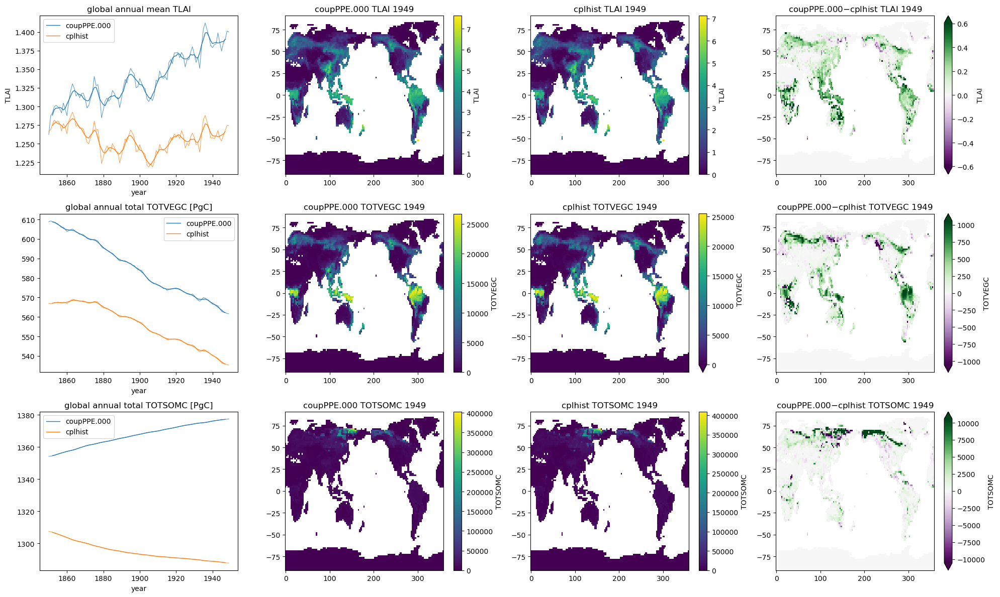

In [ ]:
fig, axes = plt.subplots(nrows=3, ncols=4, figsize=(20, 12), layout="tight")
ax = axes.flatten()

for i,v in enumerate(["TLAI", "TOTVEGC", "TOTSOMC"]):
    if v == "TLAI":
        ihist_ann = ihist[v].weighted(la).mean(dim=["lat","lon"]).groupby("time.year").mean().load()

        ihist[v].weighted(la).mean(dim=["lat","lon"]).groupby("time.year").mean().plot(ax=ax[4*i], color="tab:blue", alpha=0.75, lw=0.75)
        ihist[v].weighted(la).mean(dim=["lat","lon"]).groupby("time.year").mean().rolling(year=5, center=True).mean().plot(ax=ax[4*i], color="tab:blue", alpha=1, lw=1, label=case)
        cplhist[v].weighted(la).mean(dim=["lat","lon"]).groupby("time.year").mean().plot(ax=ax[4*i], color="tab:orange", alpha=0.75, lw=0.75)
        cplhist[v].weighted(la).mean(dim=["lat","lon"]).groupby("time.year").mean().rolling(year=5, center=True).mean().plot(ax=ax[4*i], color="tab:orange", alpha=1, lw=1, label="cplhist")
        ax[4*i].set_title(f"global annual mean {v}")
        ax[4*i].legend()

    else:
        (ihist[v]*la/1e15).sum(dim=["lat","lon"]).groupby("time.year").mean().plot(ax=ax[4*i], color="tab:blue", alpha=0.75, lw=0.75)
        (ihist[v]*la/1e15).sum(dim=["lat","lon"]).groupby("time.year").mean().rolling(year=5, center=True).mean().plot(ax=ax[4*i], color="tab:blue", alpha=1, lw=1, label=case)
        (cplhist[v]*la/1e15).sum(dim=["lat","lon"]).groupby("time.year").mean().plot(ax=ax[4*i], color="tab:orange", alpha=0.75, lw=0.75)
        (cplhist[v]*la/1e15).sum(dim=["lat","lon"]).groupby("time.year").mean().rolling(year=5, center=True).mean().plot(ax=ax[4*i], color="tab:orange", alpha=1, lw=1, label="cplhist")
        ax[4*i].set_title(f"global annual total {v} [PgC]")
        ax[4*i].legend()

    ihist[v].sel(time=slice("1949-01", "1949-12")).mean(dim="time").plot(ax=ax[4*i+1], vmin=0)
    ax[4*i+1].set_title(f"{case} {v} 1949")

    cplhist[v].sel(time=slice("1949-01", "1949-12")).mean(dim="time").plot(ax=ax[4*i+2], vmin=0)
    ax[4*i+2].set_title(f"cplhist {v} 1949")

    (ihist[v].sel(time=slice("1949-01", "1949-12")) - cplhist[v].sel(time=slice("1949-01", "1949-12"))).mean(dim="time").plot(ax=ax[4*i+3], cmap="PRGn", robust=True)
    ax[4*i+3].set_title(f"{case}$-$cplhist {v} 1949")

    for j in range(1,4):
        ax[4*i+j].set_ylabel("")
        ax[4*i+j].set_xlabel("")

---

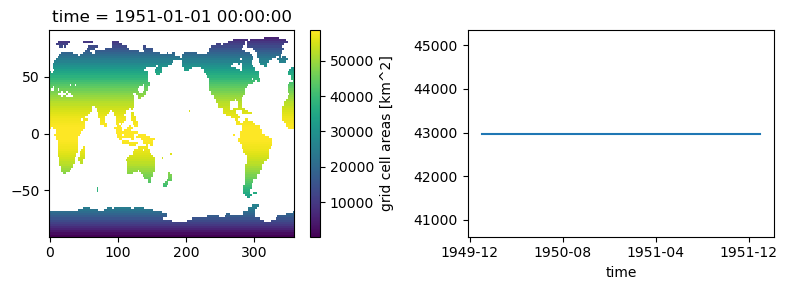

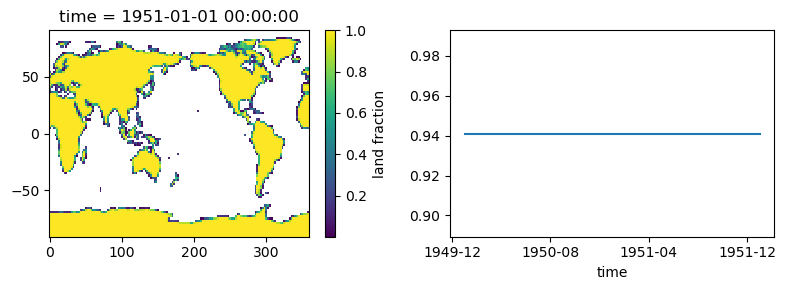

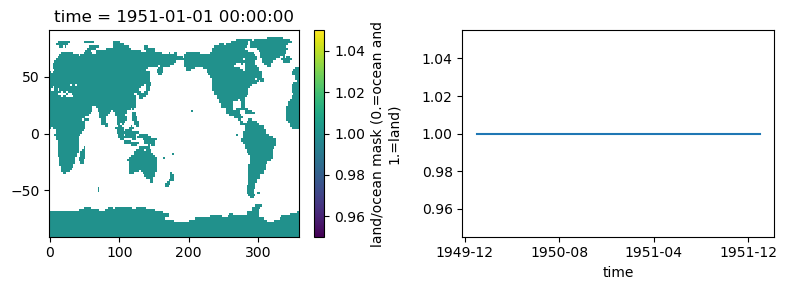

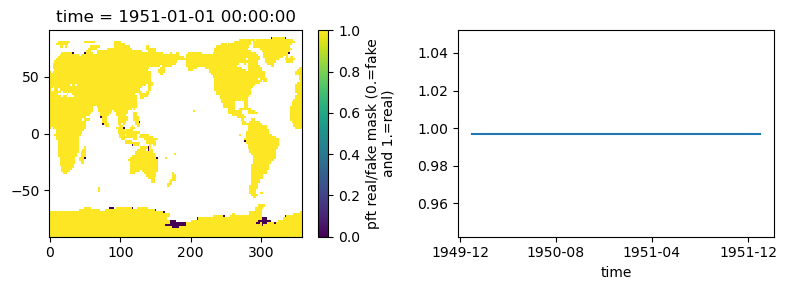

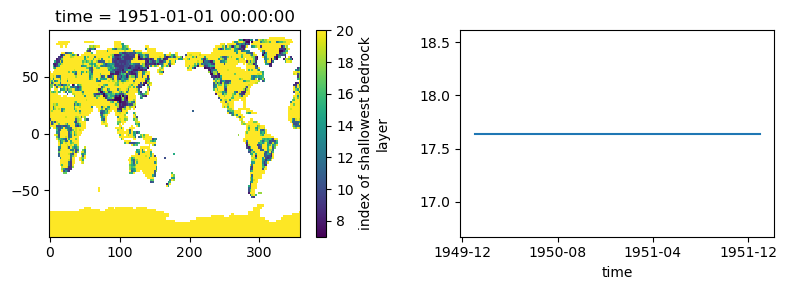

...

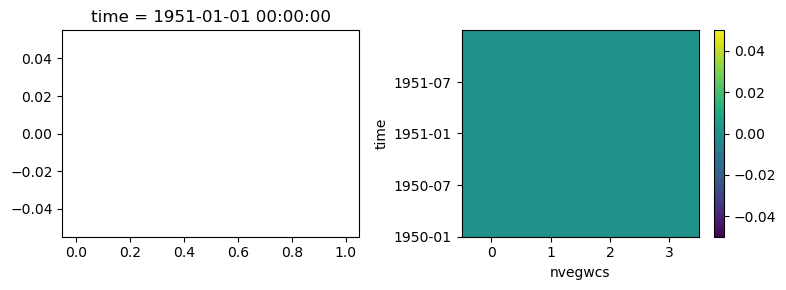

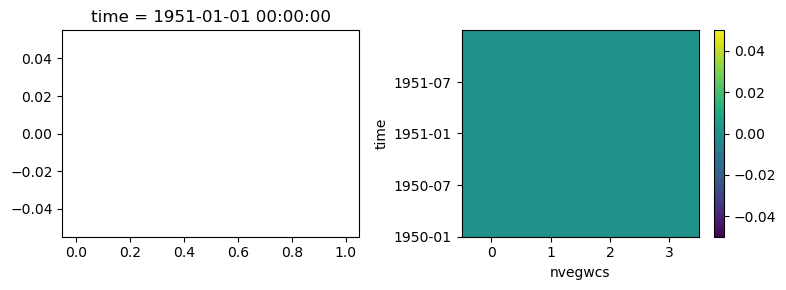

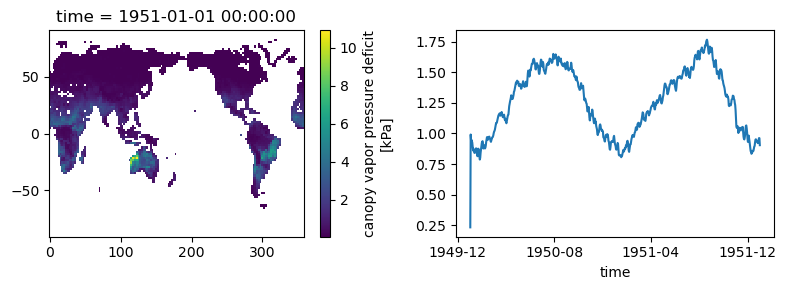

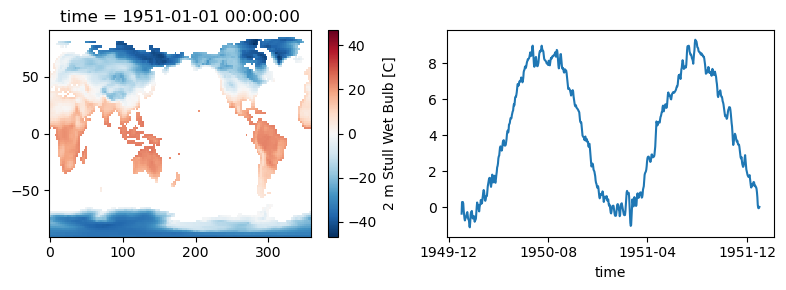

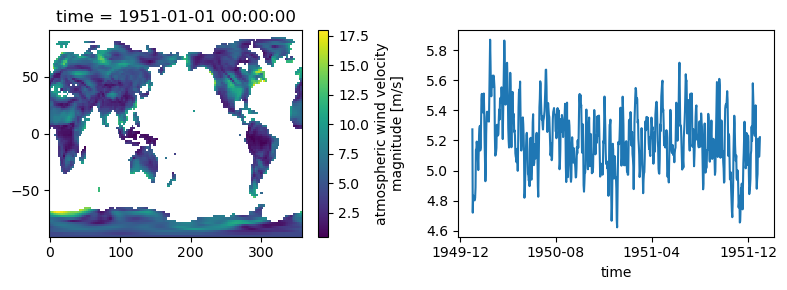

In [35]:
INDIR = "/glade/derecho/scratch/bbuchovecky/archive/f.e21.FHIST_BGC.f19_f19_mg17.historical.coupPPE.000/lnd/hist"

h2 = xr.open_mfdataset(
    f"{INDIR}/*.h2.*.nc",
    combine="by_coords",
    decode_timedelta=False,
    parallel=True,
    chunks=_get_chunk_size_from_res(case),
    engine="netcdf4",
    )

for v in h2.variables:
    if h2[v].dims and "lat" in h2[v].dims and "lon" in h2[v].dims:
        fig, ax = plt.subplots(1, 2, figsize=(8,3))
        h2[v].isel(time=365).plot(ax=ax[0])
        (h2[v].isel(time=slice(0,365*2))*lw).sum(dim=["lat","lon"]).plot(ax=ax[1])
        ax[0].set_ylabel("")
        ax[0].set_xlabel("")
        plt.tight_layout()
        plt.show()

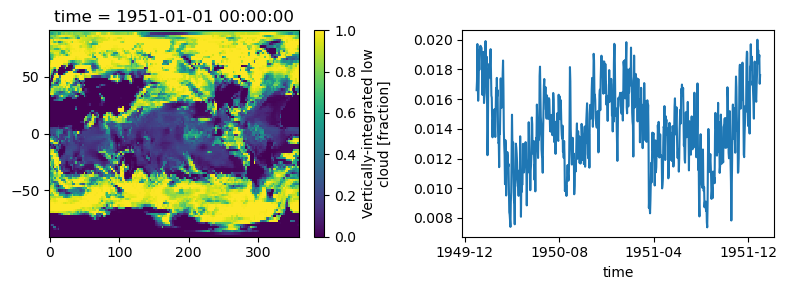

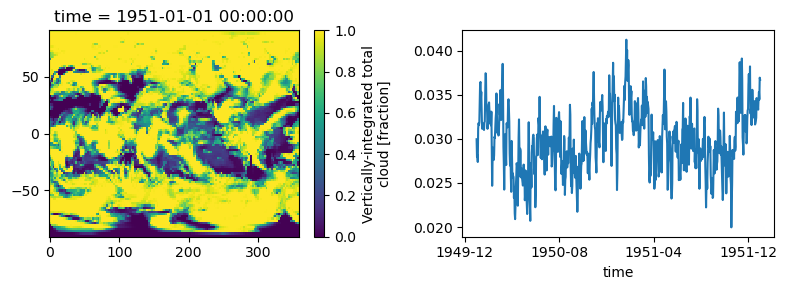

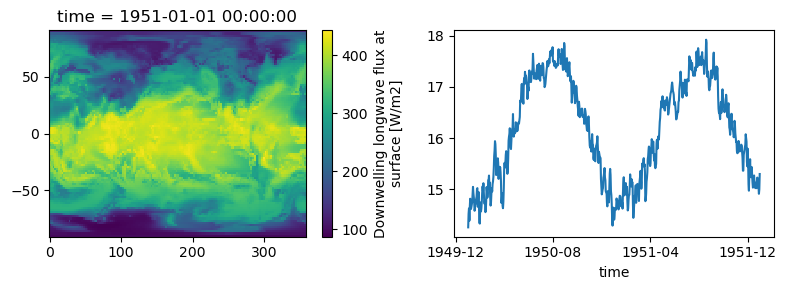

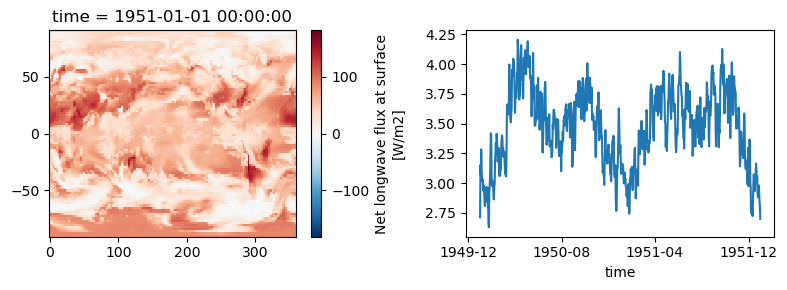

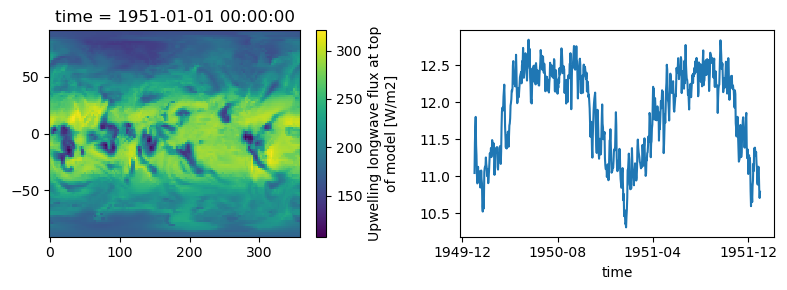

...

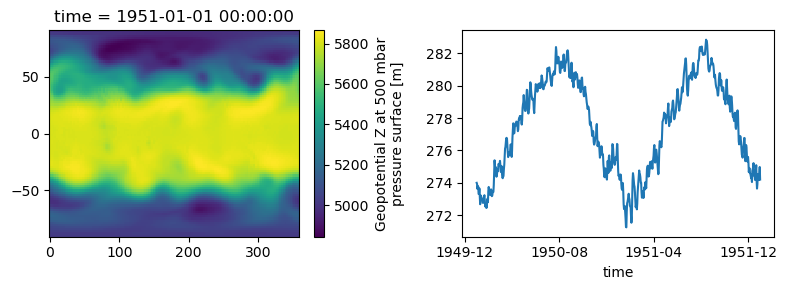

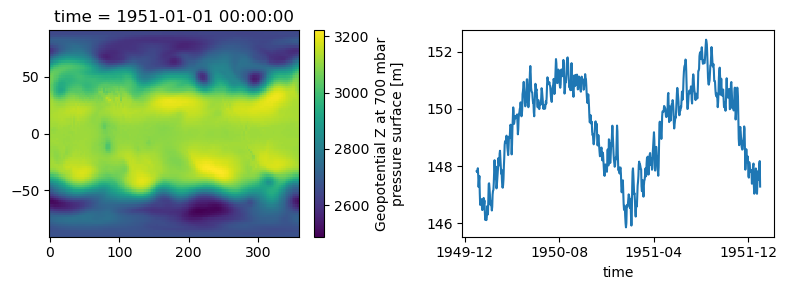

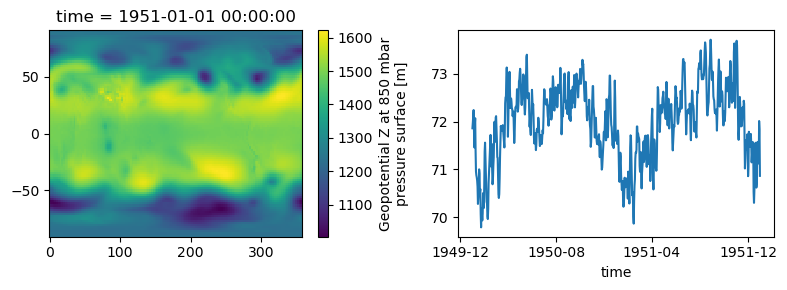

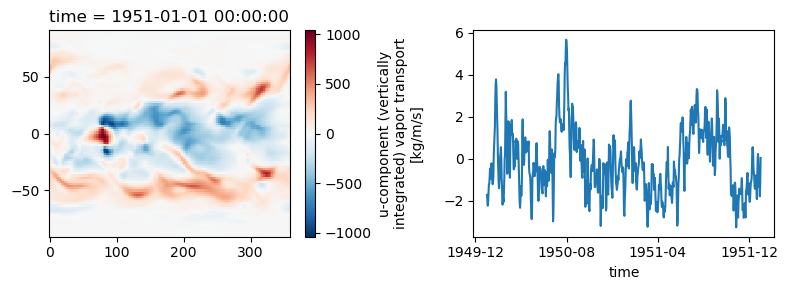

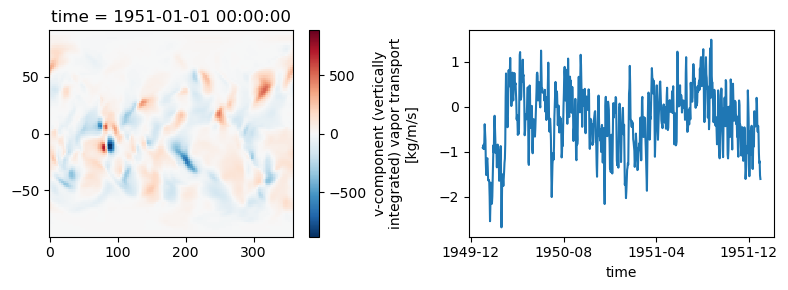

In [34]:
INDIR = "/glade/derecho/scratch/bbuchovecky/archive/f.e21.FHIST_BGC.f19_f19_mg17.historical.coupPPE.000/atm/hist"

h2 = xr.open_mfdataset(
    f"{INDIR}/*.h2.*.nc",
    combine="by_coords",
    decode_timedelta=False,
    parallel=True,
    chunks=_get_chunk_size_from_res(case),
    engine="netcdf4",
    )

for v in h2.variables:
    if h2[v].dims and "lat" in h2[v].dims and "lon" in h2[v].dims:
        fig, ax = plt.subplots(1, 2, figsize=(8,3))
        h2[v].isel(time=365).plot(ax=ax[0])
        (h2[v].isel(time=slice(0,365*2))*lw).sum(dim=["lat","lon"]).plot(ax=ax[1])
        ax[0].set_ylabel("")
        ax[0].set_xlabel("")
        plt.tight_layout()
        plt.show()

In [ ]:
client.shutdown()
del cluster
del client
!rm ./dask-worker.e*
!rm ./dask-worker.o*